In [1]:
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install 'git+https://github.com/facebookresearch/detectron2.git'

torch:  2.2 ; cuda:  cu121


In [2]:
import torch, torchvision
print("torch ", torch.__version__, torch.cuda.is_available())

torch  2.2.1+cu121 True


In [3]:
# Importamos detectron2 y su logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("detectron2 ", detectron2.__version__)

detectron2  0.6


In [4]:
# Importamos otros módulos y librerias comunes
import numpy as np
import os, json, cv2, random
import pathlib

print("numpy ", np.__version__)

numpy  1.26.4


In [5]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator
from detectron2.engine import DefaultTrainer

In [1]:
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
from detectron2.utils.logger import log_every_n_seconds
from detectron2.data import DatasetMapper, build_detection_test_loader
import detectron2.utils.comm as comm
import torch
import time
import datetime
import logging

class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)

In [9]:
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, True, output_folder)
  
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1,LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks

In [10]:
carpeta_thebridge = 'CSGO-videogame-2'

In [11]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, carpeta_thebridge + "/train/_annotations.coco.json", carpeta_thebridge + "/train")
register_coco_instances("my_dataset_val", {}, carpeta_thebridge + "/valid/_annotations.coco.json", carpeta_thebridge + "/valid")
register_coco_instances("my_dataset_test", {}, carpeta_thebridge + "/test/_annotations.coco.json", carpeta_thebridge + "/test")

WARNING [02/27 19:29:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



[02/27 19:29:21 d2.data.datasets.coco]: Loaded 1774 images in COCO format from CSGO-videogame-2/train/_annotations.coco.json


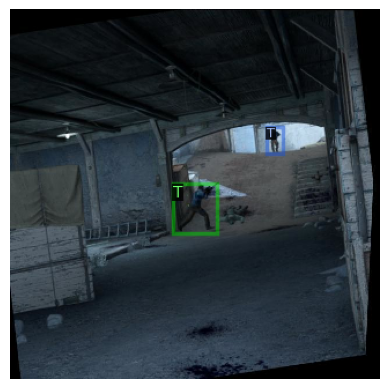

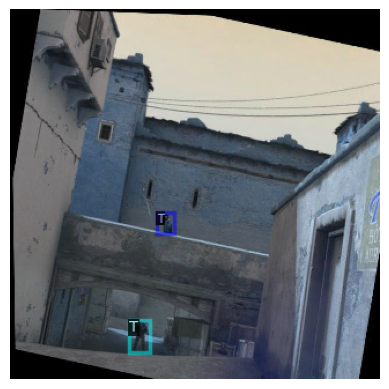

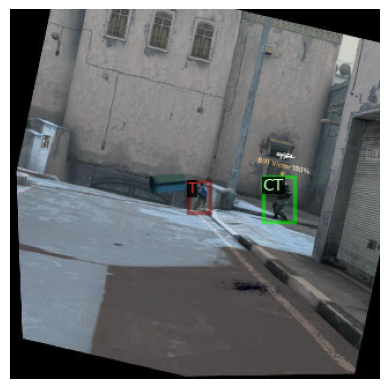

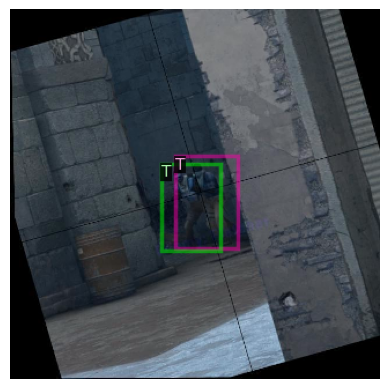

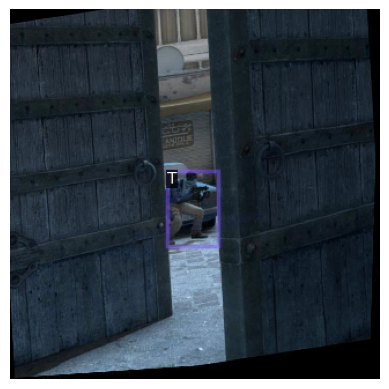

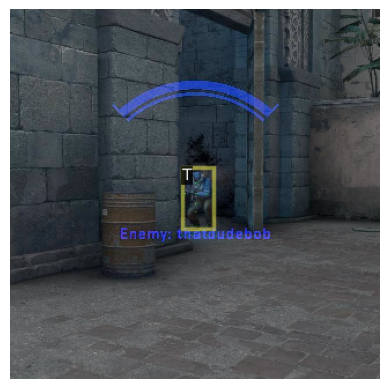

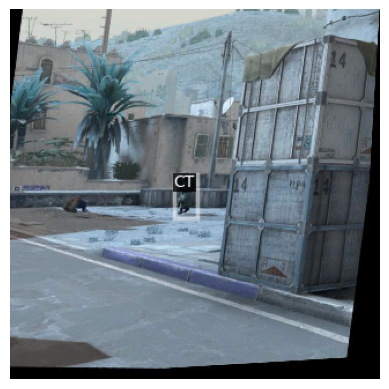

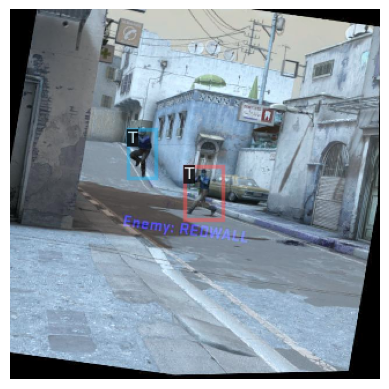

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")
import cv2
import random
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 8):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.axis('off')  # Opcional: para quitar los ejes
    plt.show()

In [12]:
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 500
cfg.SOLVER.MAX_ITER = 1501 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1375, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 80


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[02/27 19:56:50 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[02/27 19:56:51 d2.engine.train_loop]: Starting training from iteration 0


/home/luis/.local/lib/python3.10/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/27 19:57:05 d2.utils.events]:  eta: 0:15:54  iter: 19  total_loss: 2.202  loss_cls: 1.35  loss_box_reg: 0.8602  loss_rpn_cls: 0.008975  loss_rpn_loc: 0.005964    time: 0.6231  last_time: 0.6768  data_time: 0.0142  last_data_time: 0.0106   lr: 3.8962e-05  max_mem: 6527M


2024-02-27 19:57:06.163674: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-27 19:57:06.163774: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-27 19:57:06.170714: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-27 19:57:06.194616: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-27 19:57:06.998774: W tensorflow/compiler/tf2

[02/27 19:57:20 d2.utils.events]:  eta: 0:15:39  iter: 39  total_loss: 1.798  loss_cls: 0.8663  loss_box_reg: 0.8938  loss_rpn_cls: 0.008818  loss_rpn_loc: 0.006526    time: 0.6272  last_time: 0.6565  data_time: 0.0099  last_data_time: 0.0095   lr: 7.8922e-05  max_mem: 6530M
[02/27 19:57:32 d2.utils.events]:  eta: 0:15:07  iter: 59  total_loss: 1.537  loss_cls: 0.6017  loss_box_reg: 0.9125  loss_rpn_cls: 0.006729  loss_rpn_loc: 0.006645    time: 0.6200  last_time: 0.6121  data_time: 0.0098  last_data_time: 0.0108   lr: 0.00011888  max_mem: 6532M
WARNING [02/27 19:57:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 19:57:45 d2.data.datasets.coco]: Loaded 446 images in COCO format from CSGO-videogame-2/valid/_annotations.coco.json
[02/27 19:57:45 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:---

KeyboardInterrupt: 

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

Reusing TensorBoard on port 6006 (pid 25407), started 5:16:20 ago. (Use '!kill 25407' to kill it.)

In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[02/27 19:14:03 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [02/27 19:14:03 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [02/27 19:14:03 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 19:14:03 d2.data.datasets.coco]: Loaded 207 images in COCO format from CSGO-videogame-2/test/_annotations.coco.json
[02/27 19:14:03 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    CSGO    | 0            |     CT     | 188          |     T      | 41           |
|            |              |            |              |            |              |
|   total    | 229      

[02/27 19:14:09 d2.evaluation.evaluator]: Inference done 102/207. Dataloading: 0.0013 s/iter. Inference: 0.0534 s/iter. Eval: 0.0003 s/iter. Total: 0.0550 s/iter. ETA=0:00:05
[02/27 19:14:14 d2.evaluation.evaluator]: Inference done 198/207. Dataloading: 0.0012 s/iter. Inference: 0.0521 s/iter. Eval: 0.0003 s/iter. Total: 0.0537 s/iter. ETA=0:00:00
[02/27 19:14:15 d2.evaluation.evaluator]: Total inference time: 0:00:10.838894 (0.053658 s / iter per device, on 1 devices)
[02/27 19:14:15 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:10 (0.051966 s / iter per device, on 1 devices)
[02/27 19:14:15 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[02/27 19:14:15 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[02/27 19:14:15 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[02/27 19:14:15 d2.evaluati

OrderedDict([('bbox',
              {'AP': 54.64124060489608,
               'AP50': 95.61513076257964,
               'AP75': 55.58369980772385,
               'APs': 26.98017568231834,
               'APm': 52.305970483899515,
               'APl': 70.70711846645273,
               'AP-CSGO': nan,
               'AP-CT': 52.375035288213645,
               'AP-T': 56.90744592157853})])

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # threshold de reconocimiento
predictor = DefaultPredictor(cfg)

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")

cfg.MODEL.DEVICE = "cuda"
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[02/27 19:14:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [02/27 19:14:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 19:14:16 d2.data.datasets.coco]: Loaded 446 images in COCO format from CSGO-videogame-2/valid/_annotations.coco.json
[02/27 19:14:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/27 19:14:16 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[02/27 19:14:16 d2.data.common]: Serializing 446 elements to byte tensors and concatenating them all ...
[02/27 19:14:16 d2.data.common]: Serialized dataset takes 0.13 MiB
[02/27 19:14:16 d2.evaluation.evaluator]: Start inference on 446 batches
[02/27 19:14:19 d2.evaluation.evaluator]: Inference done 55/446. Dataloading:

WARNING [02/27 19:14:40 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 19:14:40 d2.data.datasets.coco]: Loaded 446 images in COCO format from CSGO-videogame-2/valid/_annotations.coco.json
WARNING [02/27 19:14:40 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 19:14:40 d2.data.datasets.coco]: Loaded 446 images in COCO format from CSGO-videogame-2/valid/_annotations.coco.json


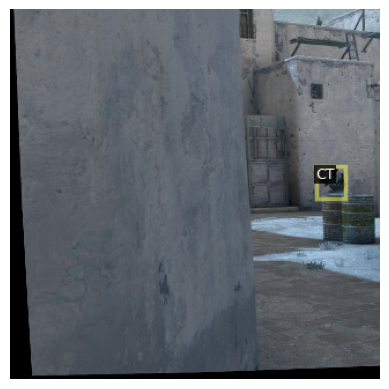

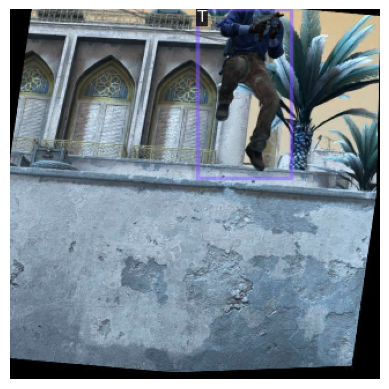

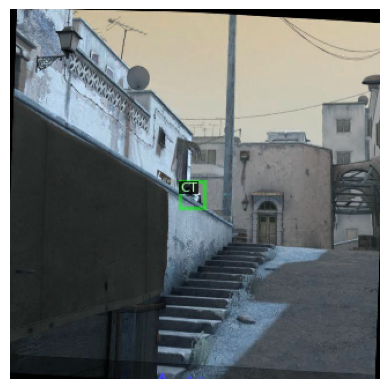

In [ ]:
from detectron2.utils.visualizer import ColorMode
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_val")
dataset_dicts = DatasetCatalog.get("my_dataset_val")

dataset_dicts = DatasetCatalog.get("my_dataset_val")
#print(dataset_dicts)

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.axis('off')  # Opcional: para quitar los ejes
    plt.show()



In [ ]:
%ls ./output/

coco_instances_results.json                             last_checkpoint
events.out.tfevents.1709056278.DESKTOP-AAPHU66.84437.0  metrics.json
instances_predictions.pth                               model_final.pth
